# ZAŁADOWANIE DANYCH

In [11]:
import plotly
import warnings
warnings.filterwarnings("ignore")
plotly.offline.init_notebook_mode(connected=True)

In [12]:
import pandas as pd
import datetime
df = pd.read_excel('20221118_analiza_rekrutacja.xlsx', index_col=0) 
df.rename(columns=df.iloc[0], inplace = True)
df = df.iloc[1:] # pierwsza kolumna to nazwy zmiennych
df

,delivery_date,delivery_hour_id,consumers_demand_volume_forecast,surplus_volume_forecast,wind_generation_volume_forecast,pv_generation_volume_forecast,oze_generation_volume_forecast,consumers_demand_minus_oze_volume_forecast,rynek_1_price D-1,rynek_1_volume D-1,...,rynek_2_volume D-1,awaria_wytwarzania,zaplanowany_brak_wytwarzania,rynek_1_price,rynek_1_volume,rynek_2_price,rynek_2_volume,price_difference,day_of_week,working_day
2021-12-03_h_00_00,2021-12-03 00:00:00,h_00_00,18218.939446,3494.961914,2915.83938,0,2915.83938,15303.100066,369.797417,3627.393612,...,194.788503,1889.1456,1868.4992,551.71019,1664.617923,609.717103,-1937.640218,-58.006912,5,1
2021-12-03_h_01_00,2021-12-03 00:00:00,h_01_00,17580.201356,5053.482853,2853.030134,0,2853.030134,14727.171222,358.076573,3932.391049,...,351.783938,1889.1456,1868.4992,494.734511,1635.949618,531.250507,-1710.122154,-36.515996,5,1
2021-12-03_h_02_00,2021-12-03 00:00:00,h_02_00,17501.423659,5799.741855,2881.773348,0,2881.773348,14619.65031,354.488994,4079.513723,...,248.712902,1889.1456,1868.4992,484.67998,1888.911318,470.727384,-940.483346,13.952596,5,1
2021-12-03_h_03_00,2021-12-03 00:00:00,h_03_00,17728.17568,6253.245898,2976.519498,0,2976.519498,14751.656182,356.628767,3914.399927,...,-189.229353,1889.1456,1868.4992,484.67998,1900.048645,466.076519,-650.118788,18.603461,5,1
2021-12-03_h_04_00,2021-12-03 00:00:00,h_04_00,17775.016474,6291.570184,3131.945767,0,3131.945767,14643.070707,381.305348,3800.385178,...,523.937693,1889.1456,1868.4992,484.67998,1708.445368,466.055894,-610.913334,18.624086,5,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-15_h_19_00,2022-11-15 00:00:00,h_19_00,22922.180913,761.16289,841.005151,0,841.005151,22081.175762,899.715828,2744.12529,...,-1801.254188,2081.15712,3409.75296,1002.081015,3958.288586,1071.20463,-1411.129262,-69.123615,2,1
2022-11-15_h_20_00,2022-11-15 00:00:00,h_20_00,22294.088458,793.099795,993.23773,0,993.23773,21300.850729,882.523127,2375.679868,...,-1560.759716,2081.15712,3409.75296,966.266258,3230.959245,948.73528,-1573.869331,17.530978,2,1
2022-11-15_h_21_00,2022-11-15 00:00:00,h_21_00,20786.666567,2056.736649,1160.374196,0,1160.374196,19626.29237,805.821328,1896.519845,...,-1268.650948,2081.15712,3409.75296,849.736816,2597.059706,774.74548,-1439.012798,74.991336,2,1
2022-11-15_h_22_00,2022-11-15 00:00:00,h_22_00,19861.5609,2880.708785,1333.898044,0,1333.898044,18527.662856,850.469121,2940.643709,...,-1269.427015,2081.15712,3409.75296,874.001752,3415.343885,774.755792,-1269.574865,99.24596,2,1


# Sprawdzenie jakiego rodzaju są zmienne

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8352 entries, 2021-12-03_h_00_00 to 2022-11-15_h_23_00
Data columns (total 21 columns):
 #   Column                                      Non-Null Count  Dtype 
---  ------                                      --------------  ----- 
 0   delivery_date                               8352 non-null   object
 1   delivery_hour_id                            8352 non-null   object
 2   consumers_demand_volume_forecast            8352 non-null   object
 3   surplus_volume_forecast                     8352 non-null   object
 4   wind_generation_volume_forecast             8352 non-null   object
 5   pv_generation_volume_forecast               8352 non-null   object
 6   oze_generation_volume_forecast              8352 non-null   object
 7   consumers_demand_minus_oze_volume_forecast  8352 non-null   object
 8   rynek_1_price D-1                           8352 non-null   object
 9   rynek_1_volume D-1                          8352 non-null   object
 10

Konwersja na zmienne liczbowe przecinkowe - float

In [14]:
for i in list(df.iloc[:,2:].columns):
    df[i] = df[i].astype('float')

df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8352 entries, 2021-12-03_h_00_00 to 2022-11-15_h_23_00
Data columns (total 21 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   delivery_date                               8352 non-null   object 
 1   delivery_hour_id                            8352 non-null   object 
 2   consumers_demand_volume_forecast            8352 non-null   float64
 3   surplus_volume_forecast                     8352 non-null   float64
 4   wind_generation_volume_forecast             8352 non-null   float64
 5   pv_generation_volume_forecast               8352 non-null   float64
 6   oze_generation_volume_forecast              8352 non-null   float64
 7   consumers_demand_minus_oze_volume_forecast  8352 non-null   float64
 8   rynek_1_price D-1                           8352 non-null   float64
 9   rynek_1_volume D-1                          8352 non-null  

Ograniczyłem się do wierszy z pierwszego warunku w linijce

In [15]:
df = df[df['consumers_demand_volume_forecast'] != 0] # Ograniczyłem się do tego warunku, bo kiedy ta zmienna przyjmowala zero, wszytskie pozostałe forecastowe również
df['price_difference_D-1'] = df['rynek_1_price D-1'] - df['rynek_2_price D-1'] # różnica cen na obu rynka w okresie D-1
df['volume_difference_D-1'] = df['rynek_1_volume D-1'] - df['rynek_2_volume D-1'] # różnica wolumeny
df['rynek_1_price_roznice'] = df['rynek_1_price D-1'].diff().fillna(0) # drugie roznice na rynku pierwszym
df['rynek_2_price_roznice'] = df['rynek_2_price D-1'].diff().fillna(0) # drugie roznice na rynku drugim
df

,delivery_date,delivery_hour_id,consumers_demand_volume_forecast,surplus_volume_forecast,wind_generation_volume_forecast,pv_generation_volume_forecast,oze_generation_volume_forecast,consumers_demand_minus_oze_volume_forecast,rynek_1_price D-1,rynek_1_volume D-1,...,rynek_1_volume,rynek_2_price,rynek_2_volume,price_difference,day_of_week,working_day,price_difference_D-1,volume_difference_D-1,rynek_1_price_roznice,rynek_2_price_roznice
2021-12-03_h_00_00,2021-12-03 00:00:00,h_00_00,18218.939446,3494.961914,2915.839380,0.0,2915.839380,15303.100066,369.797417,3627.393612,...,1664.617923,609.717103,-1937.640218,-58.006912,5.0,1.0,-76.190808,3432.605108,0.000000,0.000000
2021-12-03_h_01_00,2021-12-03 00:00:00,h_01_00,17580.201356,5053.482853,2853.030134,0.0,2853.030134,14727.171222,358.076573,3932.391049,...,1635.949618,531.250507,-1710.122154,-36.515996,5.0,1.0,-65.811315,3580.607111,-11.720844,-22.100338
2021-12-03_h_02_00,2021-12-03 00:00:00,h_02_00,17501.423659,5799.741855,2881.773348,0.0,2881.773348,14619.650310,354.488994,4079.513723,...,1888.911318,470.727384,-940.483346,13.952596,5.0,1.0,-81.662665,3830.800821,-3.587579,12.263771
2021-12-03_h_03_00,2021-12-03 00:00:00,h_03_00,17728.175680,6253.245898,2976.519498,0.0,2976.519498,14751.656182,356.628767,3914.399927,...,1900.048645,466.076519,-650.118788,18.603461,5.0,1.0,-79.512247,4103.629279,2.139773,-0.010646
2021-12-03_h_04_00,2021-12-03 00:00:00,h_04_00,17775.016474,6291.570184,3131.945767,0.0,3131.945767,14643.070707,381.305348,3800.385178,...,1708.445368,466.055894,-610.913334,18.624086,5.0,1.0,-44.190030,3276.447485,24.676582,-10.645635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-15_h_19_00,2022-11-15 00:00:00,h_19_00,22922.180913,761.162890,841.005151,0.0,841.005151,22081.175762,899.715828,2744.125290,...,3958.288586,1071.204630,-1411.129262,-69.123615,2.0,1.0,22.174857,4545.379478,-21.663867,0.000000
2022-11-15_h_20_00,2022-11-15 00:00:00,h_20_00,22294.088458,793.099795,993.237730,0.0,993.237730,21300.850729,882.523127,2375.679868,...,3230.959245,948.735280,-1573.869331,17.530978,2.0,1.0,11.806009,3936.439584,-17.192700,-6.823852
2022-11-15_h_21_00,2022-11-15 00:00:00,h_21_00,20786.666567,2056.736649,1160.374196,0.0,1160.374196,19626.292370,805.821328,1896.519845,...,2597.059706,774.745480,-1439.012798,74.991336,2.0,1.0,8.229076,3165.170793,-76.701799,-73.124866
2022-11-15_h_22_00,2022-11-15 00:00:00,h_22_00,19861.560900,2880.708785,1333.898044,0.0,1333.898044,18527.662856,850.469121,2940.643709,...,3415.343885,774.755792,-1269.574865,99.245960,2.0,1.0,56.592195,4210.070724,44.647792,-3.715327


# Podstawowe statystyki opisowe

In [16]:
perc =[.20, .40, .60, .80]
  
# list of dtypes to include
include =['object', 'float', 'int']
  
# calling describe method
desc = df.iloc[:,2:len(df.columns)-1].describe(percentiles = perc, include = include)
display(desc.transpose())

,count,mean,std,min,20%,40%,50%,60%,80%,max
consumers_demand_volume_forecast,8280.0,18779.575733,2895.073480,11651.647320,16186.687757,18057.764535,18881.097932,19571.360895,21132.862611,26118.000489
surplus_volume_forecast,8280.0,4257.643350,2553.117432,-1117.791657,2091.867244,3213.491329,3847.864709,4483.089739,6244.729391,13628.541708
wind_generation_volume_forecast,8280.0,2121.780449,1735.637353,36.195158,663.223050,1242.984323,1590.990125,2007.766729,3452.379375,8040.647986
pv_generation_volume_forecast,8280.0,1125.994453,1666.186168,0.000000,0.000000,0.000000,50.034484,506.732218,2533.874002,8348.306833
oze_generation_volume_forecast,8280.0,3247.774902,2183.629167,104.327221,1251.713743,2205.988449,2775.317000,3443.011216,5096.065393,12495.846162
consumers_demand_minus_oze_volume_forecast,8280.0,15531.800831,3519.552456,2118.481331,12708.758859,14711.202770,15510.689946,16366.598986,18477.628372,25476.068709
rynek_1_price D-1,8280.0,831.970911,435.645223,123.489364,517.271396,646.190034,713.422541,797.358049,1066.811841,4058.595050
rynek_1_volume D-1,8280.0,2811.498196,746.935821,1152.177058,2162.767172,2534.214662,2716.446639,2905.875065,3416.737790,6092.177443
rynek_2_price D-1,8280.0,795.553351,423.042665,63.884455,501.805418,614.276550,687.143791,756.691724,1028.127733,5123.744043
rynek_2_volume D-1,8280.0,-69.263154,908.034582,-47615.795462,-665.041963,-266.141297,-94.521527,84.463531,549.065862,3491.279589


Dorobienie zmiennej YEAR

In [17]:
df['YEAR'] = df['delivery_date'].astype(str).str[0:4]
df['YEAR'] 

2021-12-03_h_00_00    2021
2021-12-03_h_01_00    2021
2021-12-03_h_02_00    2021
2021-12-03_h_03_00    2021
2021-12-03_h_04_00    2021
                      ... 
2022-11-15_h_19_00    2022
2022-11-15_h_20_00    2022
2022-11-15_h_21_00    2022
2022-11-15_h_22_00    2022
2022-11-15_h_23_00    2022
Name: YEAR, Length: 8280, dtype: object

In [18]:
df_2021 = df[df['YEAR'] == '2021']
df_2022 = df[df['YEAR'] == '2022']

Sprawdzenie ile razy dane zmienne przyjmuja zero

In [19]:
for i in list(df.columns):
    print(i,(df[i] ==0).sum())

delivery_date 0
delivery_hour_id 0
consumers_demand_volume_forecast 0
surplus_volume_forecast 0
wind_generation_volume_forecast 0
pv_generation_volume_forecast 3691
oze_generation_volume_forecast 0
consumers_demand_minus_oze_volume_forecast 0
rynek_1_price D-1 0
rynek_1_volume D-1 0
rynek_2_price D-1 0
rynek_2_volume D-1 24
awaria_wytwarzania 91
zaplanowany_brak_wytwarzania 1834
rynek_1_price 0
rynek_1_volume 0
rynek_2_price 0
rynek_2_volume 24
price_difference 32
day_of_week 0
working_day 2520
price_difference_D-1 33
volume_difference_D-1 0
rynek_1_price_roznice 531
rynek_2_price_roznice 439
YEAR 0


Badana zmienna price difference w podziale na rok dla index = 2022-10-12_h_19_00 wyraźnie odstajaca wartość

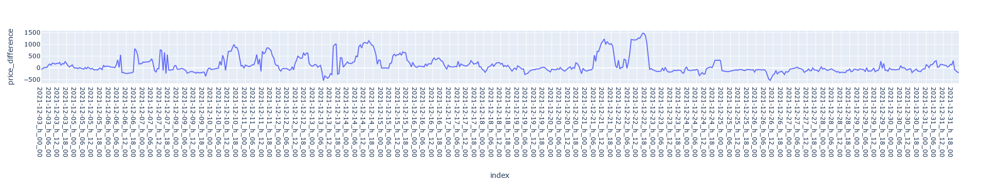

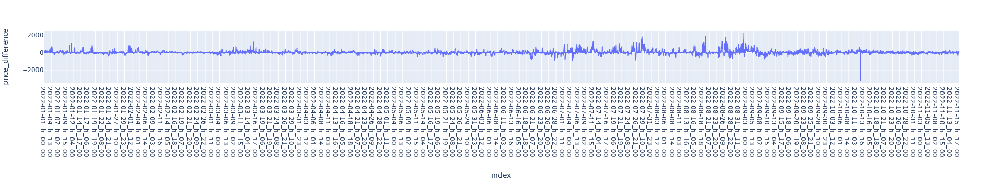

In [20]:
import plotly 
import plotly.express as px
for i in [df_2021,df_2022]:
    fig = px.line(i,y="price_difference")
    fig.show()

Wykresy wszystkich zmiennych w zależności od czasu dla roku 2021

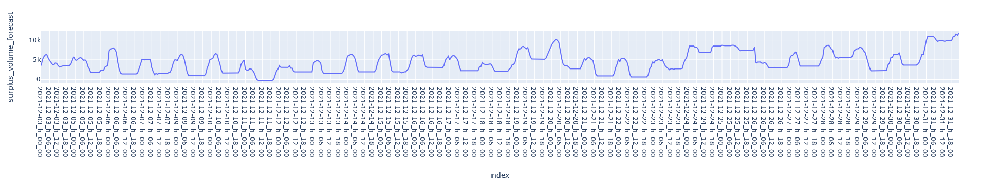

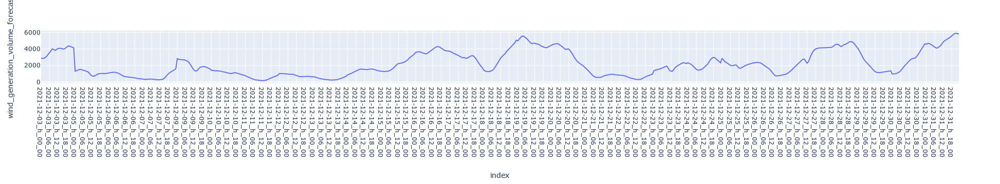

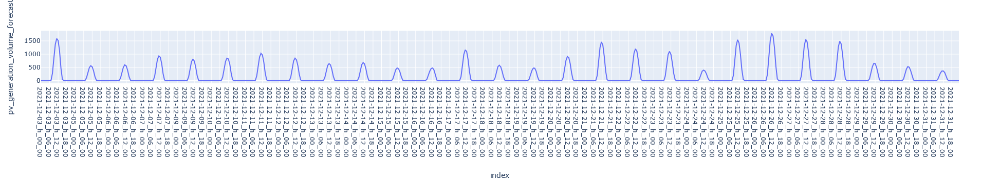

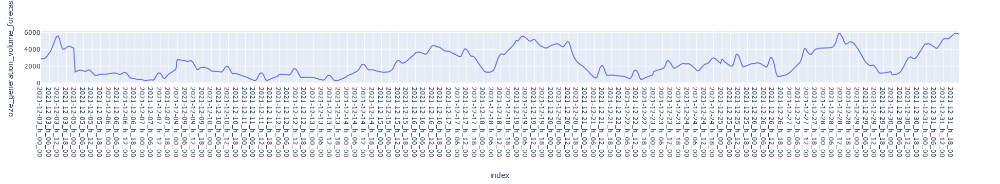

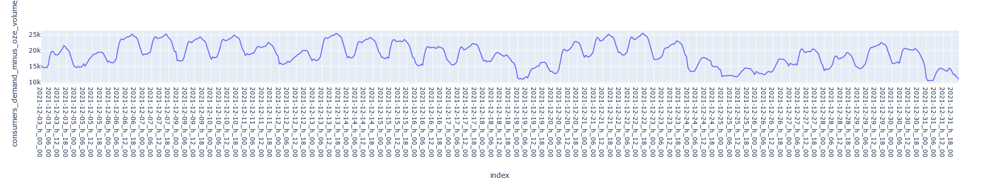

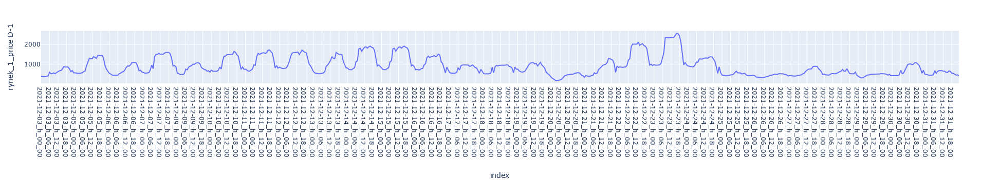

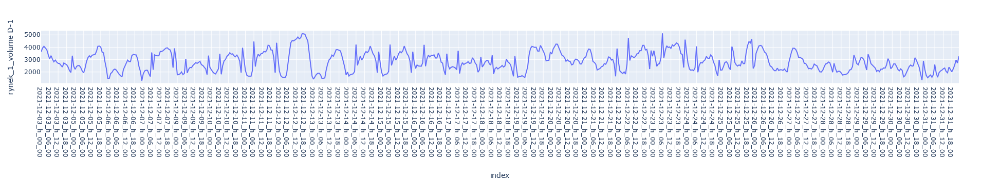

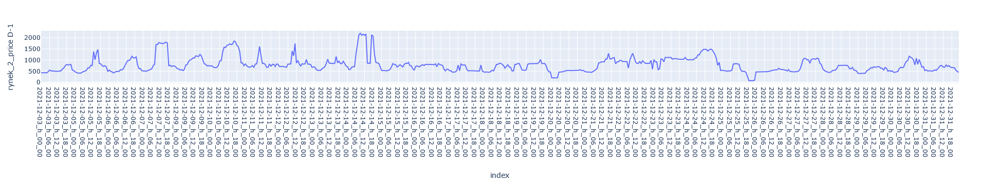

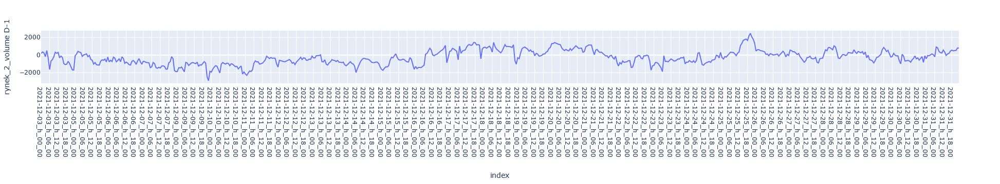

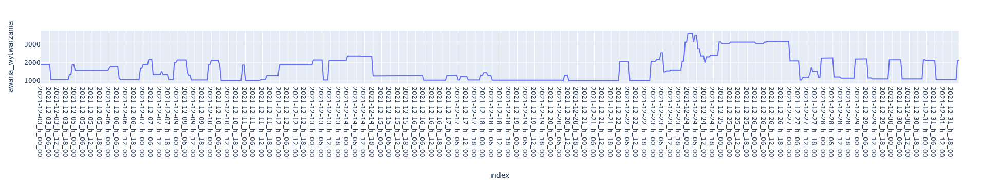

In [21]:
for i in list(df_2021.iloc[:,3:13].columns):
    fig = px.line(df_2021,y=i)
    fig.show()

Wykresy wszystkich zmiennych w zależności od czasu dla roku 2022


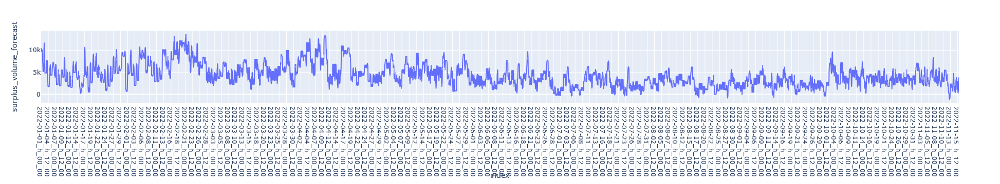

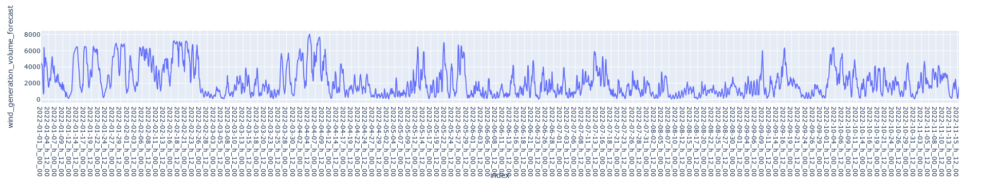

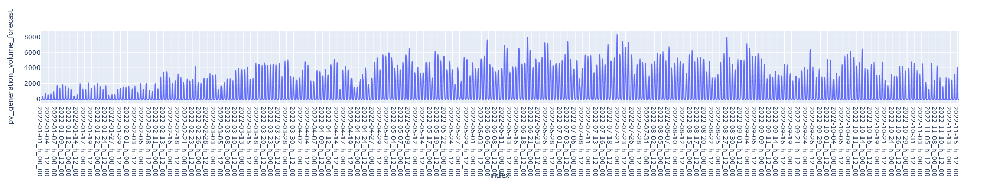

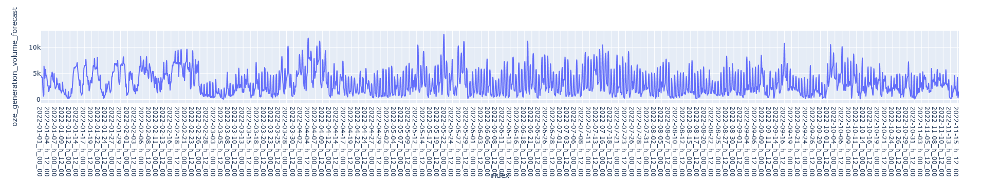

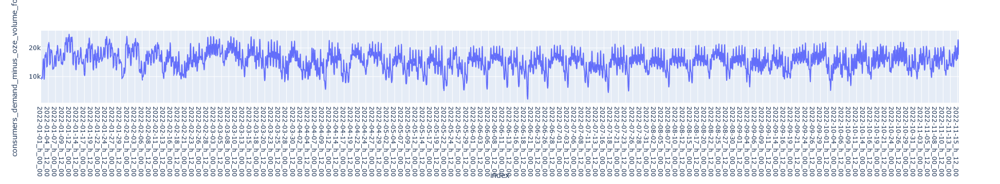

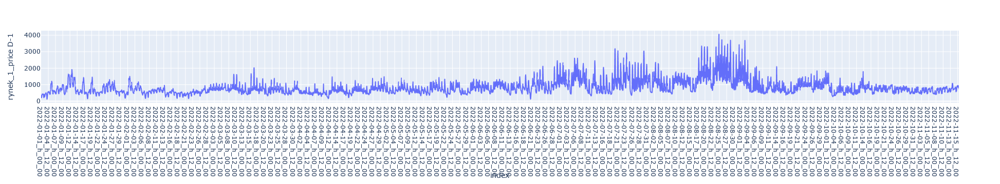

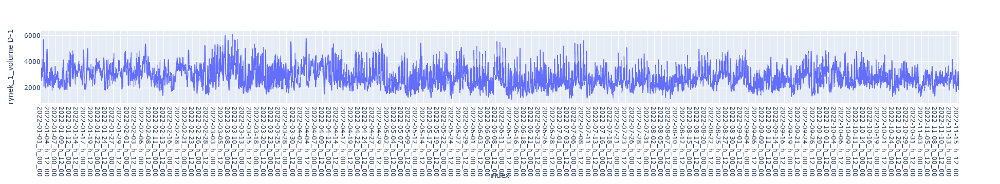

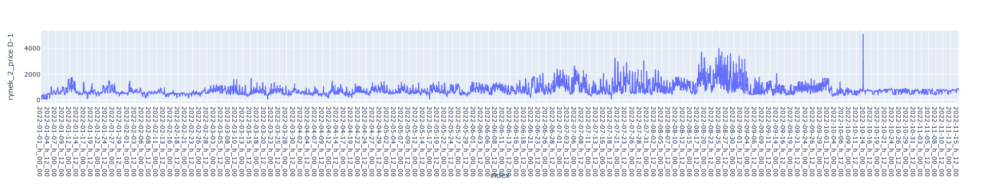

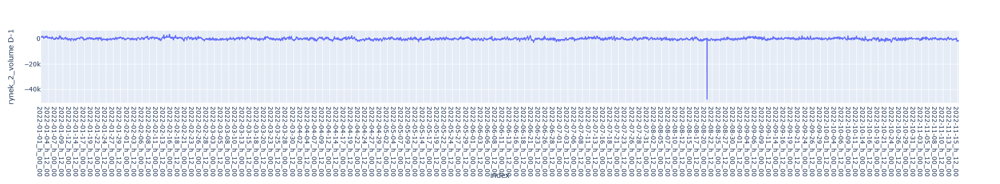

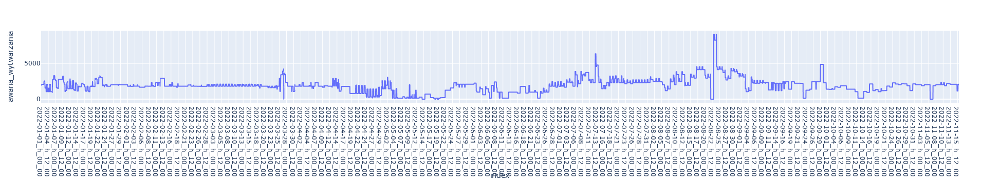

In [22]:
for i in list(df_2022.iloc[:,3:13].columns):
    fig = px.line(df_2022,y=i)
    fig.show()

# Sprawdzenie korelacji pomiędzy zmiennymi

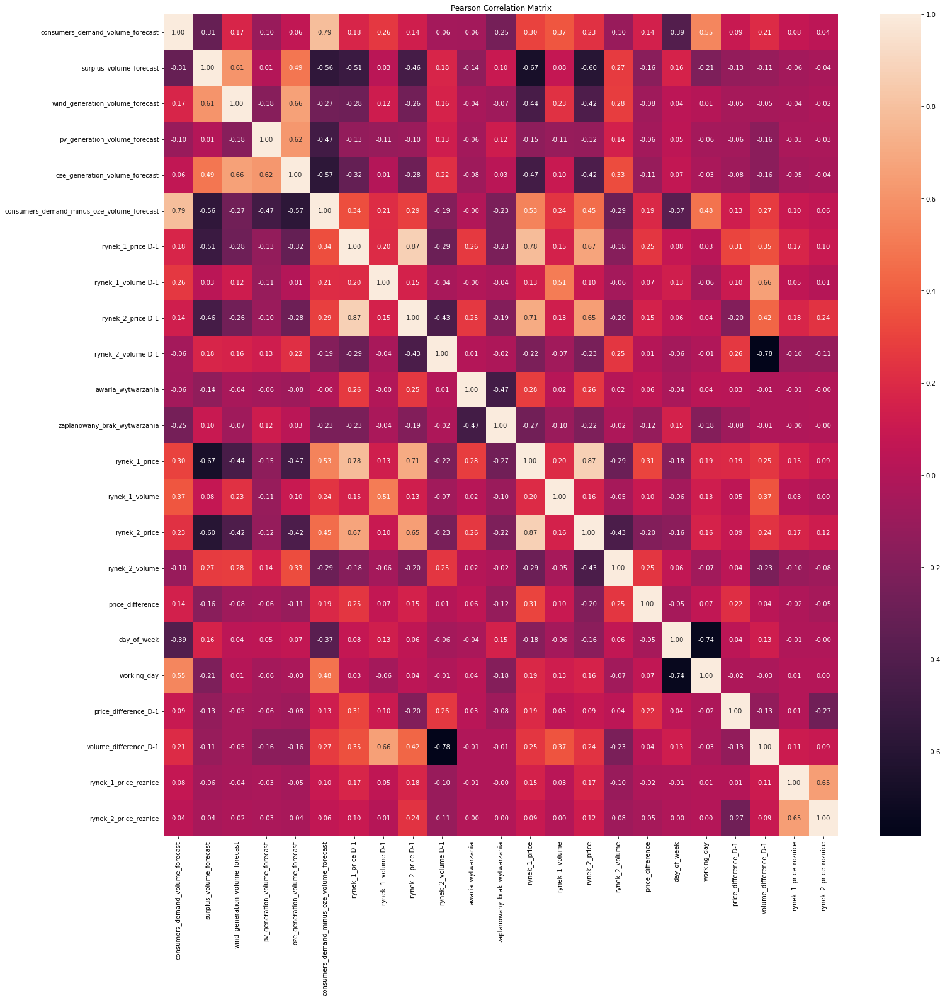

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
correlations = df.corr(method='pearson')
fig = plt.figure(figsize=(24, 24))
sns.heatmap(correlations, annot=True, fmt='.2f')
plt.title('Pearson Correlation Matrix')
plt.show()

Część zmiennych wykazuje ze sobą dośc silne korelacje np. ceny z rynku pierwsze w okresie D-1 z cenami z rynku drugiego w okresie D-1, czy zapotrzebowanie na energię odbiorców z zapotrzebowaniem na energię odbiorców pomniejszone o generację energii z wiatru i PV 
Poniżej przedstawione największe zn nich.

In [24]:
highly_correlated = abs(correlations[correlations > 0.7])
print(highly_correlated[highly_correlated < 1.0].stack().to_string())

consumers_demand_volume_forecast            consumers_demand_minus_oze_volume_forecast    0.785155
consumers_demand_minus_oze_volume_forecast  consumers_demand_volume_forecast              0.785155
rynek_1_price D-1                           rynek_2_price D-1                             0.872775
                                            rynek_1_price                                 0.780343
rynek_2_price D-1                           rynek_1_price D-1                             0.872775
                                            rynek_1_price                                 0.705223
rynek_1_price                               rynek_1_price D-1                             0.780343
                                            rynek_2_price D-1                             0.705223
                                            rynek_2_price                                 0.873215
rynek_2_price                               rynek_1_price                                 0.873215


# XGBoost

Do analizy tego, co wpływa na analizowaną zmienną price difference zastosowany zostanie model XGBoost

In [25]:
import xgboost as xgb

Zbiór chcemy podzielić w stosunku 90:10 na uczony i testowy, zbiór nie jest duży zawiera 8352 obserwacji, dlatego chcemy jak najlepiej nauczyć model stąd tak niska próbka testowa

In [26]:
(len(df) - 0.1*df.count()['delivery_hour_id'])

7452.0

Wybór zmiennych

In [27]:
import numpy as np
df.iloc[:,np.r_[2:14, 19:24]]

,consumers_demand_volume_forecast,surplus_volume_forecast,wind_generation_volume_forecast,pv_generation_volume_forecast,oze_generation_volume_forecast,consumers_demand_minus_oze_volume_forecast,rynek_1_price D-1,rynek_1_volume D-1,rynek_2_price D-1,rynek_2_volume D-1,awaria_wytwarzania,zaplanowany_brak_wytwarzania,day_of_week,working_day,price_difference_D-1,volume_difference_D-1,rynek_1_price_roznice
2021-12-03_h_00_00,18218.939446,3494.961914,2915.839380,0.0,2915.839380,15303.100066,369.797417,3627.393612,445.988226,194.788503,1889.14560,1868.49920,5.0,1.0,-76.190808,3432.605108,0.000000
2021-12-03_h_01_00,17580.201356,5053.482853,2853.030134,0.0,2853.030134,14727.171222,358.076573,3932.391049,423.887888,351.783938,1889.14560,1868.49920,5.0,1.0,-65.811315,3580.607111,-11.720844
2021-12-03_h_02_00,17501.423659,5799.741855,2881.773348,0.0,2881.773348,14619.650310,354.488994,4079.513723,436.151659,248.712902,1889.14560,1868.49920,5.0,1.0,-81.662665,3830.800821,-3.587579
2021-12-03_h_03_00,17728.175680,6253.245898,2976.519498,0.0,2976.519498,14751.656182,356.628767,3914.399927,436.141013,-189.229353,1889.14560,1868.49920,5.0,1.0,-79.512247,4103.629279,2.139773
2021-12-03_h_04_00,17775.016474,6291.570184,3131.945767,0.0,3131.945767,14643.070707,381.305348,3800.385178,425.495378,523.937693,1889.14560,1868.49920,5.0,1.0,-44.190030,3276.447485,24.676582
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-15_h_19_00,22922.180913,761.162890,841.005151,0.0,841.005151,22081.175762,899.715828,2744.125290,877.540970,-1801.254188,2081.15712,3409.75296,2.0,1.0,22.174857,4545.379478,-21.663867
2022-11-15_h_20_00,22294.088458,793.099795,993.237730,0.0,993.237730,21300.850729,882.523127,2375.679868,870.717118,-1560.759716,2081.15712,3409.75296,2.0,1.0,11.806009,3936.439584,-17.192700
2022-11-15_h_21_00,20786.666567,2056.736649,1160.374196,0.0,1160.374196,19626.292370,805.821328,1896.519845,797.592253,-1268.650948,2081.15712,3409.75296,2.0,1.0,8.229076,3165.170793,-76.701799
2022-11-15_h_22_00,19861.560900,2880.708785,1333.898044,0.0,1333.898044,18527.662856,850.469121,2940.643709,793.876926,-1269.427015,2081.15712,3409.75296,2.0,1.0,56.592195,4210.070724,44.647792


Ograniczenie zbioru oraz utworzenie zmiennych zerojedynkowych dla roku i dni pracujacych. Od poczatku 2022 zmieniły się zasady dotyczące ustalania cen, dlatego zakładam, że zmienna YEAR zawrze część zmienności dotyczącej zmiany

In [28]:
import numpy as np
X = df.iloc[:,np.r_[2:14, 19:26]] # wybranie zmiennych do modelowania
onehot_columns = ['YEAR','working_day']
onehot_df = X[onehot_columns]
onehot_df = pd.get_dummies(onehot_df, columns = onehot_columns)
score_onehot_drop = X.drop(onehot_columns, axis = 1)
X= pd.concat([score_onehot_drop, onehot_df], axis = 1) # otworzenie i dodanie zmiennych zerojedynkowych

X_train = X.iloc[:7452] # zbior treningowy
X_test = X.iloc[7452:] # zbior testowy
Y = df['price_difference']
Y_train = Y.iloc[:7452]
Y_test = Y.iloc[7452:]

In [29]:
X_train

,consumers_demand_volume_forecast,surplus_volume_forecast,wind_generation_volume_forecast,pv_generation_volume_forecast,oze_generation_volume_forecast,consumers_demand_minus_oze_volume_forecast,rynek_1_price D-1,rynek_1_volume D-1,rynek_2_price D-1,rynek_2_volume D-1,...,zaplanowany_brak_wytwarzania,day_of_week,price_difference_D-1,volume_difference_D-1,rynek_1_price_roznice,rynek_2_price_roznice,YEAR_2021,YEAR_2022,working_day_0.0,working_day_1.0
2021-12-03_h_00_00,18218.939446,3494.961914,2915.839380,0.000000,2915.839380,15303.100066,369.797417,3627.393612,445.988226,194.788503,...,1868.49920,5.0,-76.190808,3432.605108,0.000000,0.000000,1,0,0,1
2021-12-03_h_01_00,17580.201356,5053.482853,2853.030134,0.000000,2853.030134,14727.171222,358.076573,3932.391049,423.887888,351.783938,...,1868.49920,5.0,-65.811315,3580.607111,-11.720844,-22.100338,1,0,0,1
2021-12-03_h_02_00,17501.423659,5799.741855,2881.773348,0.000000,2881.773348,14619.650310,354.488994,4079.513723,436.151659,248.712902,...,1868.49920,5.0,-81.662665,3830.800821,-3.587579,12.263771,1,0,0,1
2021-12-03_h_03_00,17728.175680,6253.245898,2976.519498,0.000000,2976.519498,14751.656182,356.628767,3914.399927,436.141013,-189.229353,...,1868.49920,5.0,-79.512247,4103.629279,2.139773,-0.010646,1,0,0,1
2021-12-03_h_04_00,17775.016474,6291.570184,3131.945767,0.000000,3131.945767,14643.070707,381.305348,3800.385178,425.495378,523.937693,...,1868.49920,5.0,-44.190030,3276.447485,24.676582,-10.645635,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-12_h_07_00,20769.633551,1993.927403,668.545867,414.115195,1082.661062,19686.972489,904.878960,2300.734599,736.667285,21.185878,...,3965.14112,3.0,168.211676,2279.548721,-21.291270,21.844843,0,1,0,1
2022-10-12_h_08_00,20853.734066,1993.927403,565.283209,1675.622922,2240.906131,18612.827935,952.784317,2354.069230,736.677930,-29.329789,...,3965.14112,3.0,216.106387,2383.399018,47.905357,0.010646,0,1,0,1
2022-10-12_h_09_00,20081.925541,2754.025730,418.373449,3044.651561,3463.025010,16618.900531,827.272283,2338.313690,732.664526,-353.799157,...,3965.14112,3.0,94.607757,2692.112847,-125.512035,-4.013404,0,1,0,1
2022-10-12_h_10_00,19365.474317,3718.520246,289.561267,4013.404330,4302.965598,15062.508719,685.866315,2994.084796,732.664526,-247.818669,...,3965.14112,3.0,-46.798211,3241.903464,-141.405967,0.000000,0,1,0,1


Oszacowanie modelu wstępnego modelu

[23:23:50] WARNING: c:\windows\temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\objective\regression_obj.cu:188: reg:linear is now deprecated in favor of reg:squarederror.


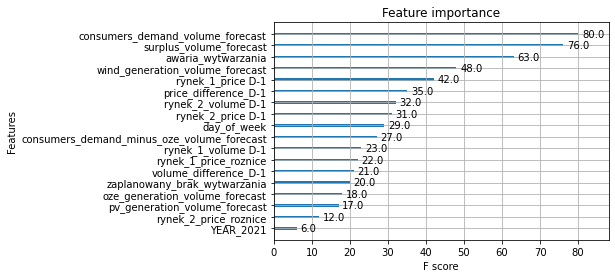

In [30]:
# import XGBRegressor
import xgboost as xgb
xgb_model = xgb.XGBRegressor(objective='reg:linear')
xgb_model.fit(X_train, Y_train, early_stopping_rounds=10, eval_set=[(X_test, Y_test)], verbose=False)

import matplotlib as plt
# # plt.figure(figsize=(40,20))
xgb.plot_importance(xgb_model,max_num_features=20)
# # xgb.plot_importance(xgb_model_Trailer)
# # plt.show()

# fig, ax = plt.subplots(1, 1, figsize=(8, 13))
# xgb.plot_importance(xgb_model, height=0.5, ax=ax)
# plt.show()


y_pred = xgb_model.predict(X_test)

MSE oraz MAE dla modelu

In [31]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

mean_squared_error(y_pred,Y_test),mean_absolute_error(y_pred,Y_test)

(20956.21551859843, 73.36312126866767)

Przeszukiwanie siatki w celu wybrania lepszej konfiguracji hiperparametrów i poprawy modelu, parametrów do konfiguracji może być więcej ale wybrałem po prostu te, które najbardziej wpływają na model

In [32]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

parameters = {
    'max_depth': range (2, 10, 1),
    'n_estimators': range(10, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05],
    'subsample': [0.7, 0.8, 0.9, 1.0]
}

random_search = RandomizedSearchCV(estimator=xgb_model, 
                           param_distributions=parameters, 
                           n_iter=48,
                           # scoring=scoring, 
                            # n_jobs = 10,
                           n_jobs=-1, 
                           cv=5, 
                           verbose=0)
# Fit grid search
random_result = random_search.fit(X_train, Y_train)
# Print grid search summary
random_result

[23:25:30] WARNING: c:\windows\temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\objective\regression_obj.cu:188: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1,
                                          enable_categorical=False, gamma=0,
                                          gpu_id=-1, importance_type=None,
                                          interaction_constraints='',
                                          learning_rate=0.300000012,
                                          max_delta_step=0, max_depth=6,
                                          min_child_weight=1, missing=nan,
                                          monotone_constraints='()',
                                          n_estimato...,
                                          num_parallel_tree=1,
                                          objective='reg:linear',
                  

Najlepsze parametry

In [33]:
random_result.best_params_

{'subsample': 0.8, 'n_estimators': 170, 'max_depth': 6, 'learning_rate': 0.01}

In [34]:
best_model = random_result.best_estimator_

Variable importance plot -
Wg statystyski F score najbardziej na zmienność kształtowania się różnicy odpowiada nadwyżka energii w portfelu,cena z rynku pierwszego w dniu poprzednim i zapotrzebowanie na energię odbiorców

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

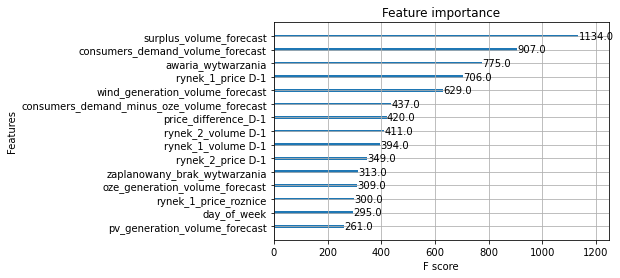

In [35]:
xgb.plot_importance(best_model,max_num_features=15)

In [36]:
# from sklearn.metrics import mean_squared_error, mean_absolute_error
# y_pred = best_model.predict(X_test)
# mean_squared_error(y_pred,Y_test),mean_absolute_error(y_pred,Y_test)

Partial dependence plot w celu sprawdzenia jak poszczególne zmienne wpływają na kształtowanie się różnicy cen i o kierunku

Biorąc pod uwagę trzy naistotniejsze zmienne 
Przykładowo dla suprlus_volume_forecast widać, że różnic cen na rynkach maleje wraz ze wzrostem nadwyżki do lekko ponad 2000, potem przestaje to mieć znaczenie,
dla rynek_1_price D-1 jest stabilnie do wartości ceny w porzednim okresie 500, potem nagły spadek do 600 i nagły wzrost różnicy przy lekko ponad 6000,
consumers_demand_colume_forecast - tutaj wraz ze wzrostem popytu różnica cen przeważnie rośnie

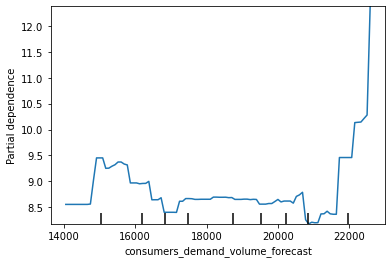

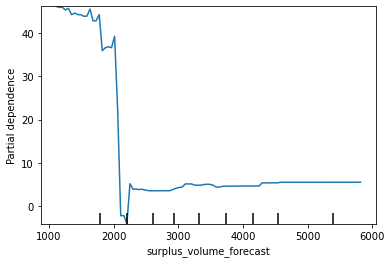

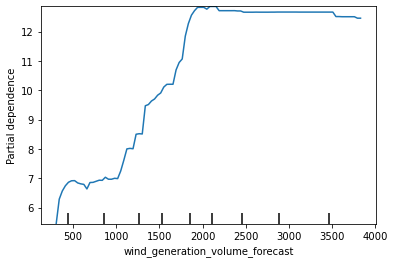

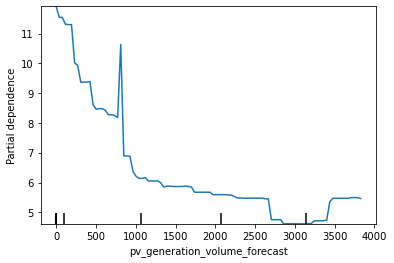

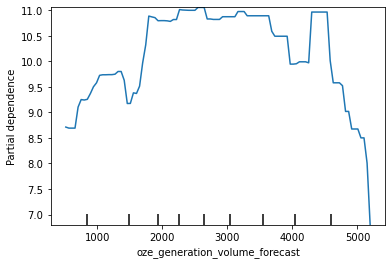

...

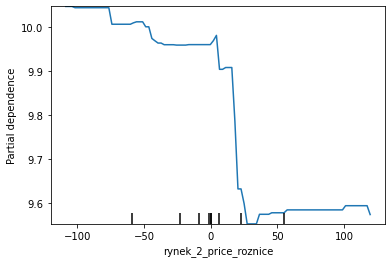

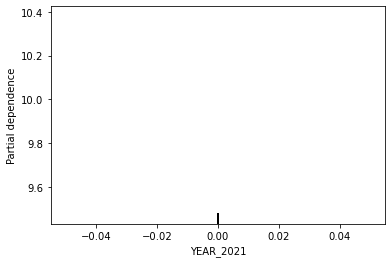

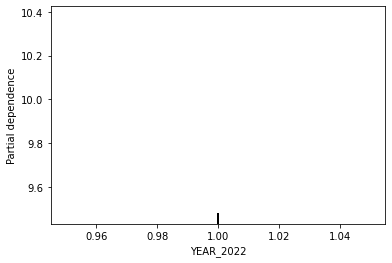

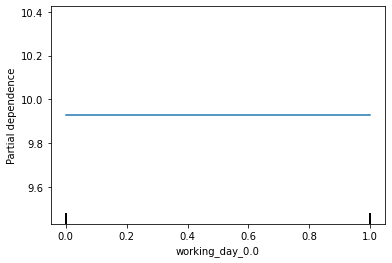

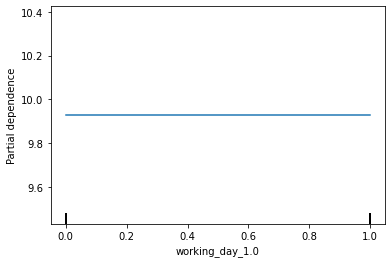

In [37]:
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import PartialDependenceDisplay
for i in list(X.columns):
    PartialDependenceDisplay.from_estimator(best_model, X_test, features = [i])

Przedstawienie predykcji vs rzeczywiste wartości na wykresie na próbce testowej. Mam wrażenie, że model "w miarę możliwości" łapie kierunki wzrostu i spadku różnicy, ale ma zdecydowanie mniejszą wariancję niż obserwowalne dane (czarna linia to rzeczywiste wartości)

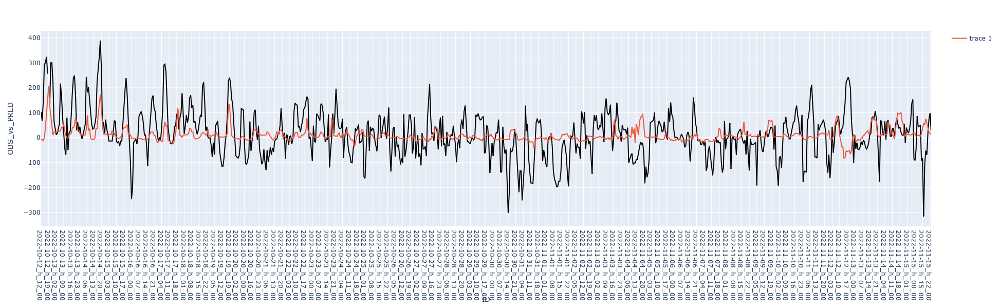

In [38]:
y_pred = best_model.predict(X_test)
pred_difference = pd.DataFrame(y_pred, columns = ['pred_difference'])
obs_difference = pd.DataFrame(Y_test)
obs_difference.reset_index(inplace=True)
obs_difference = obs_difference.rename(columns = {'index':'ID'})
bind_results = pd.concat([obs_difference,pred_difference], axis=1)
bind_results = bind_results[bind_results != min(bind_results['price_difference'])]

fig = px.line(bind_results,x = bind_results['ID'], y=bind_results['price_difference'],width=1800, height=600)
fig.update_layout(xaxis_title="ID",yaxis_title="OBS_vs_PRED")
fig.update_traces(line_color="black") # czarna linia rzecyzwiste wartości, czerwone predykcyjne

fig.add_scatter(x=bind_results['ID'], y=bind_results['pred_difference'])

fig.show()

In [39]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score

mean_squared_error(y_pred,Y_test),mean_absolute_error(y_pred,Y_test),explained_variance_score(y_pred,Y_test)

(21842.006929913234, 69.99247270757262, -30.491572621615077)

Wykres różnic - wydają się być mimo wszystko dość spore, wynika to też z tego, że model nie uchwytuje wysokiej wariancji różnicy cen w danych obserwowalnych

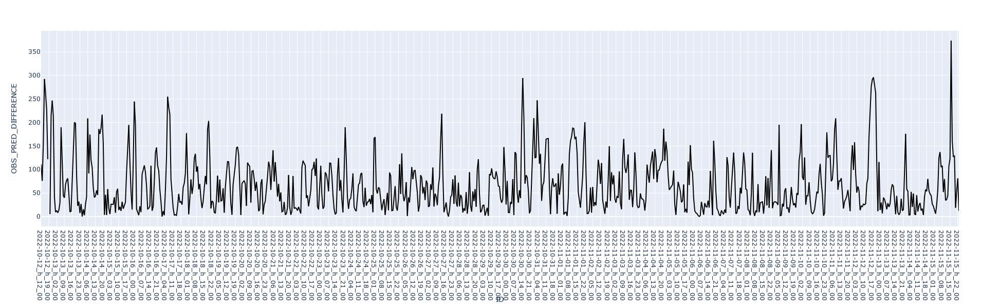

In [40]:
bind_results['OBS_PRED_DIFFERENCE'] = np.abs(bind_results['price_difference']-bind_results['pred_difference'])
fig = px.line(bind_results,x = bind_results['ID'], y=bind_results['OBS_PRED_DIFFERENCE'],width=1800, height=600)
fig.update_layout(xaxis_title="ID",yaxis_title="OBS_PRED_DIFFERENCE")
fig.update_traces(line_color="black")

# MODEL tylko  dla 2022

Postanowiłem jeszcze wykonać drugiego Xgboost'a dla danych tylko z okresu 2022 roku, ze względu na zmianę w zasadach wyceny, dane z 2021 stanowiły tylko około 10%.

Okrajam zbiór do danych z 2022 i podejmuje podobne kroki

In [41]:
X_2022 = df.iloc[:,np.r_[2:14, 19:26]][df['YEAR'] == '2022']
X_2022 = X_2022.drop('YEAR', axis=1)
onehot_columns = ['working_day']
onehot_df = X_2022[onehot_columns]
onehot_df = pd.get_dummies(onehot_df, columns = onehot_columns)
score_onehot_drop = X_2022.drop(onehot_columns, axis = 1)
X_2022 = pd.concat([score_onehot_drop, onehot_df], axis = 1)
X_2022
Y_2022 = df['price_difference'][df['YEAR'] == '2022']

In [42]:
X_2022.columns

Index(['consumers_demand_volume_forecast', 'surplus_volume_forecast',
       'wind_generation_volume_forecast', 'pv_generation_volume_forecast',
       'oze_generation_volume_forecast',
       'consumers_demand_minus_oze_volume_forecast', 'rynek_1_price D-1',
       'rynek_1_volume D-1', 'rynek_2_price D-1', 'rynek_2_volume D-1',
       'awaria_wytwarzania', 'zaplanowany_brak_wytwarzania', 'day_of_week',
       'price_difference_D-1', 'volume_difference_D-1',
       'rynek_1_price_roznice', 'rynek_2_price_roznice', 'working_day_0.0',
       'working_day_1.0'],
      dtype='object')

Ponownie dzielimy na zbior treningowy i testowy w proporcji 90:10 tylko na 2022 roku

In [43]:
X_train_2022 = X_2022.iloc[:6869]
X_test_2022 = X_2022.iloc[6869:]
# Y_2022 = df['price_difference']
Y_train_2022 = Y_2022.iloc[:6869]
Y_test_2022 = Y_2022.iloc[6869:]

In [44]:
X_train_2022

,consumers_demand_volume_forecast,surplus_volume_forecast,wind_generation_volume_forecast,pv_generation_volume_forecast,oze_generation_volume_forecast,consumers_demand_minus_oze_volume_forecast,rynek_1_price D-1,rynek_1_volume D-1,rynek_2_price D-1,rynek_2_volume D-1,awaria_wytwarzania,zaplanowany_brak_wytwarzania,day_of_week,price_difference_D-1,volume_difference_D-1,rynek_1_price_roznice,rynek_2_price_roznice,working_day_0.0,working_day_1.0
2022-01-01_h_00_00,14317.314281,9769.499082,4526.523929,0.0,4526.523929,9790.790352,342.640403,2797.459920,202.267062,895.558707,1971.73120,0.00000,6.0,140.373341,1901.901213,-58.135812,-241.911406,1,0
2022-01-01_h_01_00,13795.678175,10336.911419,4383.872422,0.0,4383.872422,9411.805752,255.495236,3093.621481,159.684522,896.611560,1971.73120,0.00000,6.0,95.810713,2197.009921,-87.145167,-42.582539,1,0
2022-01-01_h_02_00,13434.791154,10328.394911,4324.256867,0.0,4324.256867,9110.534286,211.134876,3477.928899,202.267062,950.843618,1971.73120,0.00000,6.0,8.867814,2527.085281,-44.360360,42.582539,1,0
2022-01-01_h_03_00,13774.386905,10080.351619,4309.352979,0.0,4309.352979,9465.033926,212.912697,3512.101386,74.232012,1304.398990,1971.73120,0.00000,6.0,138.680685,2207.702396,1.777821,-128.035050,1,0
2022-01-01_h_04_00,13777.580595,10080.351619,4310.417542,0.0,4310.417542,9467.163053,212.912697,3345.603658,74.136201,1713.154108,1971.73120,0.00000,6.0,138.776496,1632.449550,0.000000,-0.095811,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-10-15_h_00_00,16087.683353,4183.734488,2219.614862,0.0,2219.614862,13868.068491,765.304042,2104.109724,719.432002,-350.166866,1081.87136,3965.14112,6.0,45.872040,2454.276590,31.819803,9.559780,1,0
2022-10-15_h_01_00,16156.879980,4183.734488,2300.521687,0.0,2300.521687,13856.358293,733.484240,2139.879057,719.432002,-336.872598,1081.87136,3965.14112,6.0,14.052238,2476.751655,-31.819803,0.000000,1,0
2022-10-15_h_02_00,16253.755257,4183.734488,2406.978035,0.0,2406.978035,13846.777222,723.967042,2217.485735,729.023719,-569.600014,939.41120,3965.14112,6.0,-5.056677,2787.085749,-9.517198,9.591717,1,0
2022-10-15_h_03_00,16412.375216,4183.734488,2520.886327,0.0,2520.886327,13891.488888,744.012773,2307.867175,731.259302,-804.784444,939.41120,3965.14112,6.0,12.753471,3112.651618,20.045730,2.235583,1,0


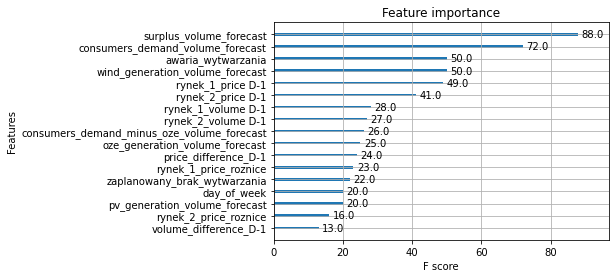

In [45]:
# import XGBRegressor
import xgboost as xgb
xgb_model_2022 = xgb.XGBRegressor()
xgb_model_2022.fit(X_train_2022, Y_train_2022, early_stopping_rounds=10, eval_set=[(X_test_2022, Y_test_2022)], verbose=False)

import matplotlib as plt
# # plt.figure(figsize=(40,20))
xgb.plot_importance(xgb_model_2022,max_num_features=20)
# # xgb.plot_importance(xgb_model_Trailer)
# # plt.show()

# fig, ax = plt.subplots(1, 1, figsize=(8, 13))
# xgb.plot_importance(xgb_model, height=0.5, ax=ax)
# plt.show()


y_pred_2022 = xgb_model_2022.predict(X_test_2022)

In [46]:
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

parameters = {
    'max_depth': range (2, 10, 1),
    'n_estimators': range(40, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05],
    'subsample': [0.7, 0.8, 0.9, 1.0]
}
random_search_2022 = RandomizedSearchCV(estimator=xgb_model, 
                           param_distributions=parameters, 
                           n_iter=48,
                           # scoring=scoring, 
                            # n_jobs = 10,
                           n_jobs=-1, 
                           cv=5, 
                           verbose=0)
# Fit grid search
random_result_2022 = random_search_2022.fit(X_train_2022, Y_train_2022)
# Print grid search summary
random_result_2022

[23:26:49] WARNING: c:\windows\temp\abs_557yfx631l\croots\recipe\xgboost-split_1659548953302\work\src\objective\regression_obj.cu:188: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1,
                                          enable_categorical=False, gamma=0,
                                          gpu_id=-1, importance_type=None,
                                          interaction_constraints='',
                                          learning_rate=0.300000012,
                                          max_delta_step=0, max_depth=6,
                                          min_child_weight=1, missing=nan,
                                          monotone_constraints='()',
                                          n_estimato...,
                                          num_parallel_tree=1,
                                          objective='reg:linear',
                  

In [47]:
best_model_2022 = random_result_2022.best_estimator_

In [48]:
random_result_2022.best_params_

{'subsample': 0.8, 'n_estimators': 80, 'max_depth': 2, 'learning_rate': 0.01}

Tutaj trzy naistotniejsze i najbardziej kształtujące zmienność różnicy cen są zmienne: cena z okresu D-1 dla rynku pierwszego, nadwyżka energii w portfelu i różnica cen w okresie D-1 na rynku pierwszym i drugim

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

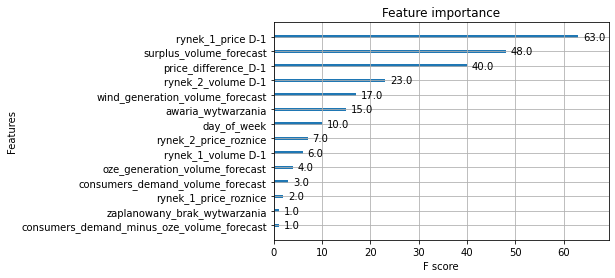

In [49]:
xgb.plot_importance(best_model_2022,max_num_features=20)

dla rynek_1_price D-1 zależność jest stała, dla surplus_volume_forecast różnica spada wraz ze wzrostem nadywżki do około 2000, a wartości zdają się nie wpływać na różnicę cen, 
dla różnicy cen w okresie D-1 na obu rynkach gdy jej wartośc wynosi około 25 różnica cen podnosi się ale jest stała do około 100 potem następuje nagły wzrost

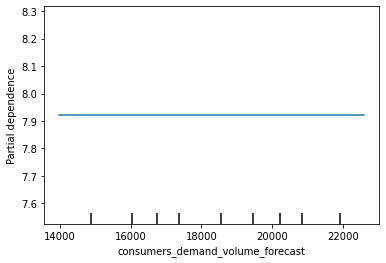

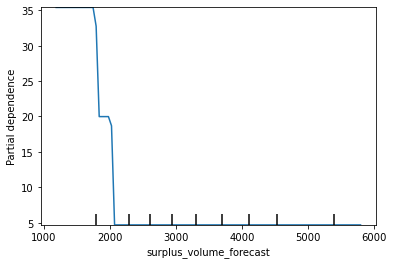

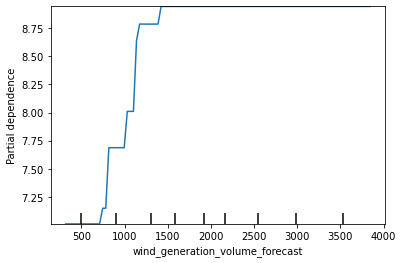

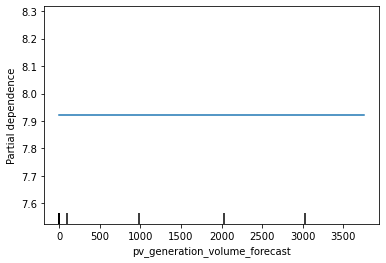

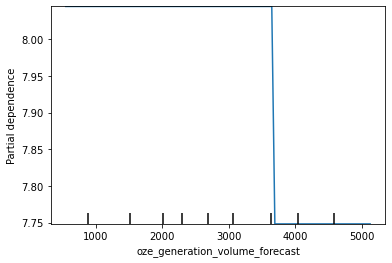

...

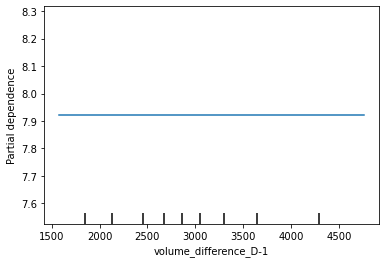

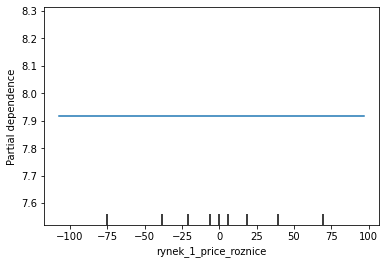

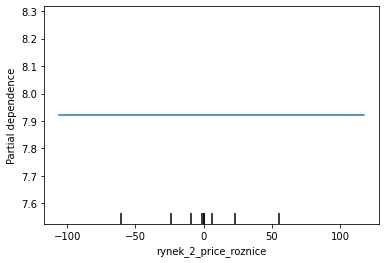

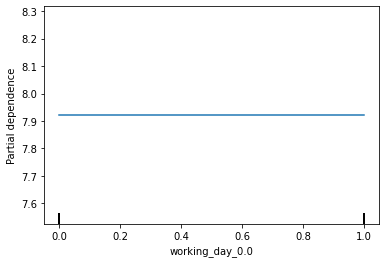

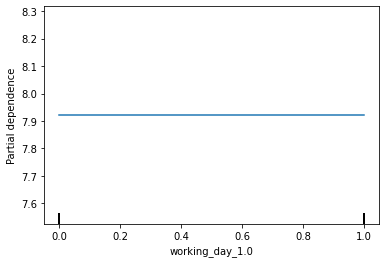

In [50]:
for i in list(X_2022.columns):
    PartialDependenceDisplay.from_estimator(best_model_2022, X_test_2022, features = [i])

In [51]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score

mean_squared_error(y_pred_2022,Y_test_2022),mean_absolute_error(y_pred_2022,Y_test_2022),explained_variance_score(y_pred_2022,Y_test_2022)

(7055.651497845295, 63.983681657638066, -15.471885973916226)

Porównanie predykcji na zbiorze testowym do rzeczywistych danych na wykresie, XGBoost dla 2022 jest dość płytki i ma mało drzew, dlatego też mało dywersyfikuje wartości są strasznie płytkie i mam wrażenie, że gorzej radzą sobie niż te predykcje z modelu dla całego zbioru.

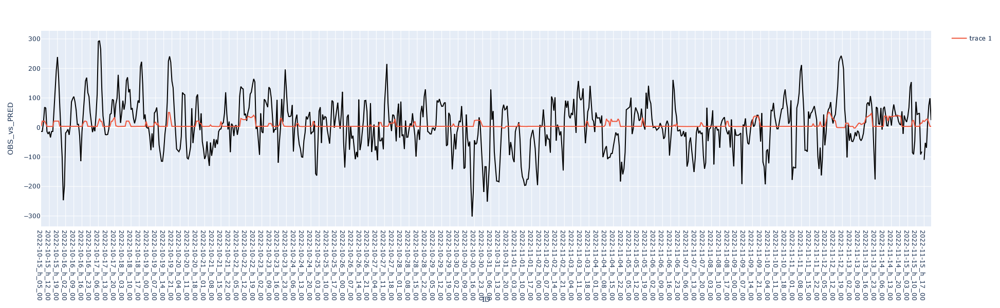

In [52]:
y_pred_2022 = best_model_2022.predict(X_test_2022)
pred_difference_2022 = pd.DataFrame(y_pred_2022, columns = ['pred_difference'])
obs_difference_2022 = pd.DataFrame(Y_test_2022)
obs_difference_2022.reset_index(inplace=True)
obs_difference_2022 = obs_difference_2022.rename(columns = {'index':'ID'})
bind_results_2022 = pd.concat([obs_difference_2022,pred_difference_2022], axis=1)
bind_results_2022 = bind_results_2022[bind_results_2022 != min(bind_results_2022['price_difference'])]

fig = px.line(bind_results_2022,x = bind_results_2022['ID'], y=bind_results_2022['price_difference'],width=1800, height=600)
fig.update_layout(xaxis_title="ID",yaxis_title="OBS_vs_PRED")
fig.update_traces(line_color="black")
# Only thing I figured is - I could do this 
# fig.add_line(vertical_concat,x = 'ID', y='price_difference') # Not what is desired - need a line 
fig.add_scatter(x=bind_results_2022['ID'], y=bind_results_2022['pred_difference'])
# fig.update_layout(showlegend=True)
# fig.update_traces(line_color="green")
# Show plot 
fig.show()

Tutaj wykres różnić i ponownie jak w poprzednim modelu są one dość duże.

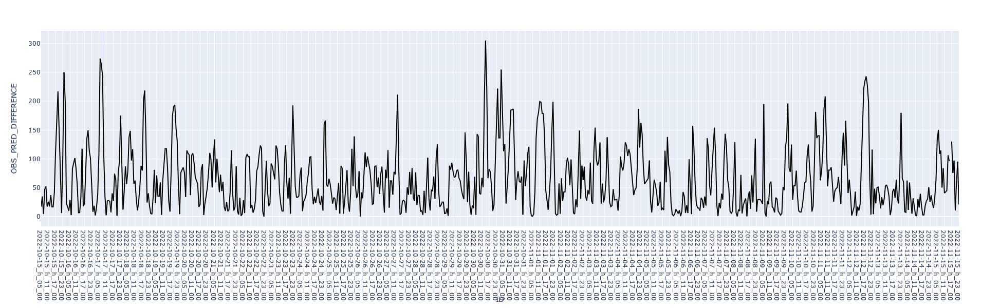

In [53]:
bind_results_2022['OBS_PRED_DIFFERENCE'] = np.abs(bind_results_2022['price_difference']-bind_results_2022['pred_difference'])
fig = px.line(bind_results_2022,x = bind_results_2022['ID'], y=bind_results_2022['OBS_PRED_DIFFERENCE'],width=1800, height=600)
fig.update_layout(xaxis_title="ID",yaxis_title="OBS_PRED_DIFFERENCE")
fig.update_traces(line_color="black")

# PODSUMOWANIE

Przedstawiłem powyżej proces (uproszczony, gdyż starałem się zmieścić w około 5h) który przeprowadziłbym w celu znalezienia czynników najbardziej wpływających na róznicę cen energii. Próbowałem to zrobić za pomocą dwóch XGBoostów dla całości danych i tylko dla 2022. Lepiej moim zdaniem wypadł ten dla całego zakresu danych, bo lepiej radzi sobie z predykcją, wartości predykcji są mniej "płytkie". Poniżej dla modelu dla całości danych ponownie wykres najważniejszych zmiennych dla kształtowania różnicy cen. Na pewno należałoby jeszcze więcej czasu poświęcić na kalibrację modelu, bo być może większa liczba hiperparametrów pozwoliłaby lepiej wyuczyć model (albo przykładowo użycie grid search zamiast random search). Również niektóre ze zmiennych są dość mocno pokorelowane, więc to też w jakiś sposób może wpływać na uczenie i predykcję modelu. Można by też zastosować jakieś inne modele, widzę że w internecie stosunkowo często pojawiają się DNN - głębokie sieci neuronowe, ale wolałem wykorzystać technikę z którą mam jakieś doświadczenie.

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

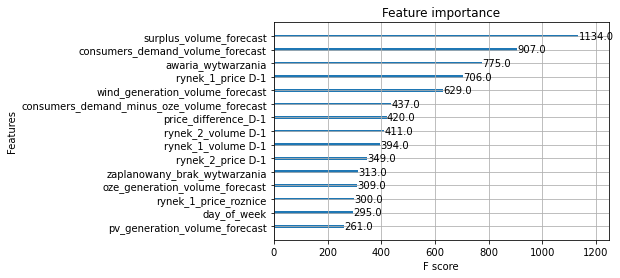

In [ ]:
xgb.plot_importance(best_model,max_num_features=15)